# Optimal Growth Model 

In this notebook, I try to solve Optimal growth model by value function iteration using **parallel computing**.


Here we use *@distributed for* loop. If you know more efficient way to code, please let me know.

**Result**

Compared with serial computing, computational time for parallel computing is about **7 times faster!!**

**Notice**

When we use parallel computing, we cannot use monotonicity of policy function and concavity of value function according to the Fernandez and Valencia(2018). Thus my code is little bit different from previous one.


## Reference

These two are good references for parallel computing in Julia.

[Julia's documentation](https://docs.julialang.org/en/v1/manual/parallel-computing/)

[Fernandez and Valencia(2018)](https://www.sas.upenn.edu/~jesusfv/Guide_Parallel.pdf)

If you don't know value function iteration, see [my repo](https://github.com/tokupooh/Julia_macro) or some textbooks.




In [1]:
using BenchmarkTools
using Plots
using LinearAlgebra
using Profile # if use @profile, this statement is needed.
using Distributed
@everywhere using SharedArrays
pyplot()

Plots.PyPlotBackend()

In [2]:
addprocs(4)

4-element Array{Int64,1}:
 2
 3
 4
 5

In [3]:
@everywhere struct Model{TI<:Integer, TF<:AbstractFloat} # everywhere is important
    # primitive parameter
    β::TF #subjective discount factor
    σ::TF # relative risk aversion
    δ::TF #depriciation rate
    α::TF # capital share

    # discretize asset space
    #agrid::SharedArray{Float64,1}
    # iteration settings
    maxiter::TI
    tol::TF
end

In [4]:
@everywhere function Construct(
    β = 0.95, #subjective discount factor
    σ = 2.0, # relative risk aversion
    δ = 0.1,#depriciation rate
    α = 0.33, # capital share
    )


    #iteration settings
    maxiter = 10000
    tol = 1e-5
    return model = Model(β, σ, δ, α,maxiter,tol)
end

In [5]:
@everywhere function main(m::Model,na=300)
    
    # Steady state

    aterm = 1.0/m.β -(1.0 -m.δ)
    kstar = m.α/aterm
    kstar = kstar^(1.0/(1.0-m.α))    
    # asset grid
    amin = 0.1 * kstar
    amax = 2.0 * kstar
    
    agrid = SharedArray{Float64,1}(collect(LinRange(amin,amax,na)))

    # utility function
    u(c) = (c^(1.0-m.σ))/(1.0-m.σ)
    
    #grid size
    #na = size(m.agrid, 1)

    #initialize value function and so on

    util= SharedArray{Float64}((na,na)) # utility matrix
    v0= SharedArray{Float64}(na) # initial guess of value function
    Tv= SharedArray{Float64}(na) # update value function
    pol_a= SharedArray{Float64}(na) # policy
    a_index= SharedArray{Int64}(na)
    penalty = -1e10
    resource= SharedArray{Float64}(na)
    resource = agrid.^m.α .+(1.0-m.δ).*agrid
    
    #create consuption and utility matrix        
    @inbounds @sync @distributed for i in 1:na
        @inbounds for j in 1:na
            c = resource[i] - agrid[j]
            if c >= 0.0
                util[i,j] = u(c)
            else
                util[i,j] = penalty
            end
        end
    end
    
    # value function iteration
    for it in 1:m.maxiter
        
        gridstart::Int64=1 # monotonicity
        @inbounds @sync @distributed  for i in 1:na
            vmin = penalty
            @inbounds for j in gridstart:na
                v = util[i,j] + m.β * v0[j]
                if v > vmin
                    vmin = v
                    gridstart = j
                else
                    break # concavity 
                end
            end
            Tv[i] = vmin
            a_index[i] = gridstart
        end
       
        error = maximum(abs.(Tv-v0)) # update error
        v0    = copy(Tv) # update value function

        if error < m.tol
        
        @inbounds for i in 1:na
            pol_a[i]   = agrid[a_index[i]]
        end
            break
        end
            
    end
    
    return agrid ,v0, pol_a
end

In [6]:
@everywhere m = Construct()

In [7]:
agrid,vfun, polfun = main(m,10000);

In [8]:
@time main(m);

  0.684358 seconds (229.27 k allocations: 16.557 MiB, 1.14% gc time)


In [9]:
@benchmark main(m)

BenchmarkTools.Trial: 
  memory estimate:  15.87 MiB
  allocs estimate:  220442
  --------------
  minimum time:     571.957 ms (1.05% GC)
  median time:      612.385 ms (0.97% GC)
  mean time:        611.609 ms (0.67% GC)
  maximum time:     658.754 ms (0.00% GC)
  --------------
  samples:          9
  evals/sample:     1

When we try same computation with serial computing, The mean time for serial computing is 4.135 s(with sample size 2)

Roughly speaking, computational time for parallel computing is about **7 times faster** than that for serial computing!

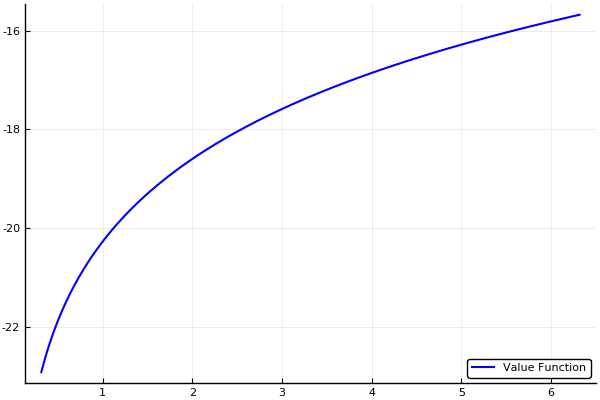

In [10]:
plot(agrid,vfun, color="blue", linewidth=1.5, label="Value Function",legend=:bottomright)

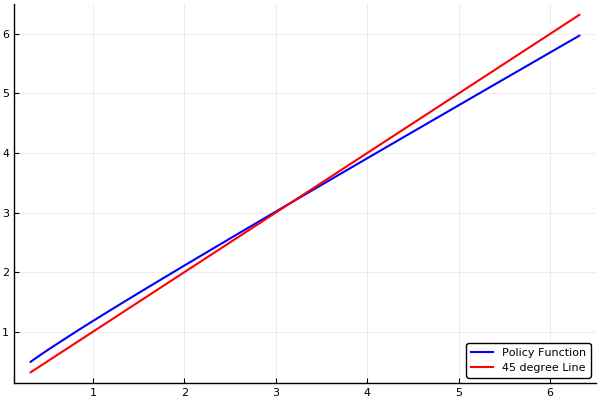

In [11]:
plot(agrid, polfun, color="blue", linewidth=1.5, label="Policy Function",legend=:bottomright)
plot!(agrid, agrid, color="red", linewidth=1.5, label="45 degree Line",legend=:bottomright)